In [1]:
import sys
print(sys.executable)
!conda info | grep 'active env'

/sc/arion/work/massen06/.conda/envs/qc/bin/python3.8
     active environment : qc
    active env location : /sc/arion/work/massen06/.conda/envs/qc


In [2]:
import os
import copy
import pge
import anndata as ad
import scanpy as sc
import pandas as pd
import pegasus as pg
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime

/sc/arion/work/massen06/.conda/envs/qc/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/sc/arion/work/massen06/.conda/envs/qc/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/sc/arion/work/massen06/.conda/envs/qc/lib/python3.8/site-packag

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.4 scipy==1.10.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.6 louvain==0.8.1 pynndescent==0.5.10


# Mouse Living Brain - QC and Annotation
Nicolas Masse, Donghoon Lee  
July 2023

In [7]:
mouse_mitocarta_fn = "MouseMitoCarta3.0.csv" 
save_dir = "/sc/arion/work/massen06/living_brain1/anndata"
anndata_fn = os.path.join(save_dir, "mouse_living_brain.h5ad")

In [8]:
anndata_fn = os.path.join(save_dir, "mouse_living_brain.h5ad")
data = pg.read_input(anndata_fn, file_type='h5ad', genome='GRCm39', modality='rna')
data

2023-07-23 21:39:34,192 - pegasusio.readwrite - INFO - h5ad file '/sc/arion/work/massen06/living_brain1/anndata/mouse_living_brain.h5ad' is loaded.
2023-07-23 21:39:34,193 - pegasusio.readwrite - INFO - Function 'read_input' finished in 0.72s.


MultimodalData object with 1 UnimodalData: 'GRCm39-rna'
    It currently binds to UnimodalData object GRCm39-rna

UnimodalData object with n_obs x n_vars = 78565 x 56481
    UID: GRCm39-rna; Genome: GRCm39; Modality: rna
    It contains 1 matrix: 'X'
    It currently binds to matrix 'X' as X

    obs: 'unique_id', 'SubID', 'pmi', 'living', 'Channel', 'cdna_amp_cycle', 'input_ng', 'pcr_cycle', 'batch'
    var: 'gene_name', 'gene_type', 'gene_id', 'gene_chrom', 'gene_start', 'gene_end'
    uns: 'genome', 'modality', 'uid'

### Identify robust genes and remove genes with low expression

In [9]:
### identify robust genes
pg.identify_robust_genes(data, percent_cells=0.05)

### remove features that are not robust (expressed at least 0.05% of cells) from downstream analysis
data._inplace_subset_var(data.var['robust'])

2023-07-23 21:39:37,752 - pegasus.tools.preprocessing - INFO - After filtration, 37660/56481 genes are kept. Among 37660 genes, 24058 genes are robust.
2023-07-23 21:39:37,753 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 1.80s.


### Add gene descriptions

In [10]:
### add ribosomal genes
data.var['ribosomal'] = [x.startswith("RP") for x in data.var.gene_name]

### add mitochondrial genes
data.var['mitochondrial'] = [x.startswith("MT-") for x in data.var.gene_name]

### add protein_coding genes
data.var['protein_coding'] = [x=='protein_coding' for x in data.var.gene_type]

# TODO: find mouse equivalent
### define mitocarta_genes
mitocarta = pd.read_csv(mouse_mitocarta_fn)
data.var['mitocarta_genes'] = [True if x in list(mitocarta.Symbol) else False for x in data.var.gene_name]

### define robust_protein_coding genes (exclude ribosomal (RPL,RPS), mitochondrial, or mitocarta genes
data.var['robust_protein_coding'] = data.var['robust'] & data.var['protein_coding']
data.var.loc[data.var.ribosomal, 'robust_protein_coding'] = False
data.var.loc[data.var.mitochondrial, 'robust_protein_coding'] = False
data.var.loc[data.var.mitocarta_genes, 'robust_protein_coding'] = False

### show
data.var[data.var['robust_protein_coding']]

,gene_name,gene_type,gene_id,gene_chrom,gene_start,gene_end,n_cells,percent_cells,robust,highly_variable_features,ribosomal,mitochondrial,protein_coding,mitocarta_genes,robust_protein_coding
featurekey,,,,,,,,,,,,,,,
Pcmtd1,Pcmtd1,protein_coding,ENSMUSG00000051285,1,7159144.0,7243852.0,30436,38.739897,True,True,False,False,True,False,True
Cdh7,Cdh7,protein_coding,ENSMUSG00000026312,1,109910161.0,110067887.0,12781,16.268058,True,True,False,False,True,False,True
Exo1,Exo1,protein_coding,ENSMUSG00000039748,1,175708147.0,175741055.0,268,0.341119,True,True,False,False,True,False,True
Uxs1,Uxs1,protein_coding,ENSMUSG00000057363,1,43786126.0,43866960.0,22476,28.608159,True,True,False,False,True,False,True
Cdh19,Cdh19,protein_coding,ENSMUSG00000047216,1,110816056.0,110905314.0,9560,12.168268,True,True,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Smndc1,Smndc1,protein_coding,ENSMUSG00000025024,19,53367821.0,53379009.0,5088,6.476166,True,True,False,False,True,False,True
Papss2,Papss2,protein_coding,ENSMUSG00000024899,19,32573190.0,32644587.0,2632,3.350092,True,True,False,False,True,False,True
Pten,Pten,protein_coding,ENSMUSG00000013663,19,32734897.0,32803560.0,38182,48.599249,True,True,False,False,True,False,True


### Determine the upper and lower ranges of genes per cell, and number of cells with expression for each gene

In [11]:
pg.qc_metrics(data)

In [12]:
### nUMI and nGene QCs
n_genes_lower, n_genes_upper = pge.qc_boundary(data.obs.n_genes, k=3)
n_counts_lower, n_counts_upper = pge.qc_boundary(data.obs.n_counts, k=3)

print('genes lower: %d upper: %d' % (n_genes_lower, n_genes_upper))
print('UMIs lower: %d upper: %d' % (n_counts_lower, n_counts_upper))

n_genes_upper = 15000
n_counts_upper = 200000

print('genes lower: %d upper: %d' % (n_genes_lower, n_genes_upper))
print('UMIs lower: %d upper: %d' % (n_counts_lower, n_counts_upper))

genes lower: 391 upper: 7011
UMIs lower: 438 upper: 27074
genes lower: 391 upper: 15000
UMIs lower: 438 upper: 200000


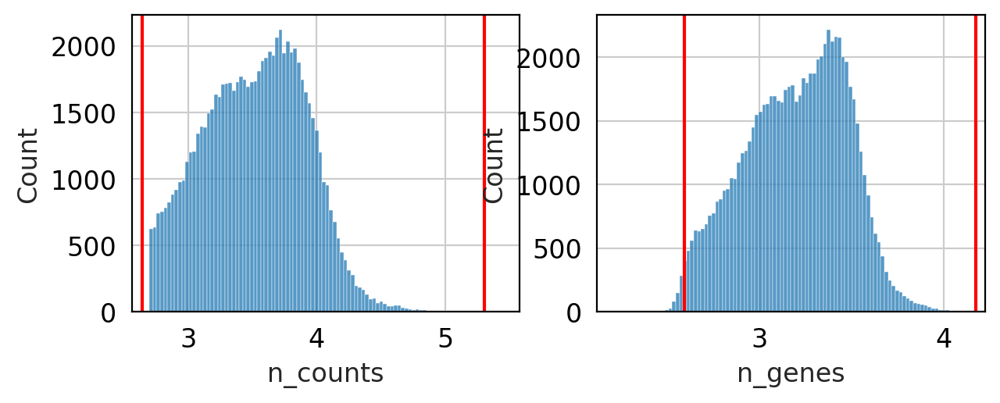

In [13]:
f, ax = plt.subplots(1, 2, figsize=(7,2.5))

# Library size (millions) VS. Number of cells
sns.histplot(np.log10(data.obs.n_counts), ax=ax[0])
ax[0].axvline(np.log10(n_counts_lower), color='red')
ax[0].axvline(np.log10(n_counts_upper), color='red')

# number of genes per cells
sns.histplot(np.log10(data.obs.n_genes), ax=ax[1])
ax[1].axvline(np.log10(n_genes_lower), color='red')
ax[1].axvline(np.log10(n_genes_upper), color='red')

plt.show()

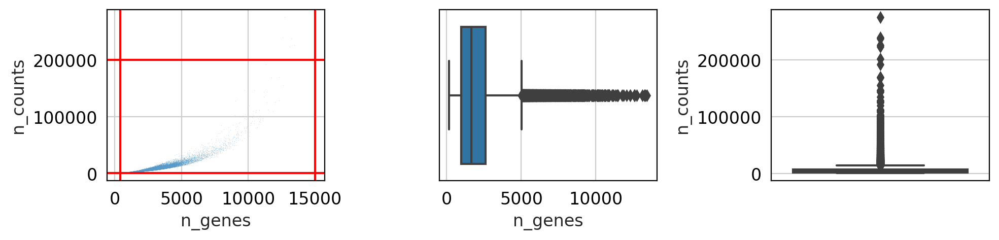

In [14]:
f, ax = plt.subplots(1, 3, figsize=(10,2.5))
sns.scatterplot(x=data.obs.n_genes, y=data.obs.n_counts, alpha=0.5, s=0.1, ax=ax[0])

# gene
ax[0].axvline(n_genes_lower, color='red')
ax[0].axvline(n_genes_upper, color='red')

# umi
ax[0].axhline(n_counts_lower, color='red')
ax[0].axhline(n_counts_upper, color='red')

sns.boxplot(x=data.obs.n_genes, ax=ax[1])

sns.boxplot(y=data.obs.n_counts, ax=ax[2])

plt.tight_layout()
plt.show()

In [15]:
## FILTER QC
pg.qc_metrics(
    data, 
    min_genes=n_genes_lower, 
    max_genes=n_genes_upper,
    min_umis=n_counts_lower, 
    max_umis=n_counts_upper,
    mito_prefix='MT-', 
    percent_mito=1,
)

# Error while running pg.get_filter_stats. Since it's just for information puporposes, as opposed to actually filtering, I'm skipping for now.
"""
df = pg.get_filter_stats(data)
print(np.sum(df['kept']))
print(np.mean(df['kept']))
df
"""

"\ndf = pg.get_filter_stats(data)\nprint(np.sum(df['kept']))\nprint(np.mean(df['kept']))\ndf\n"

### Donor QC
We keep all donors since they all contribute a significant portion cells after QC

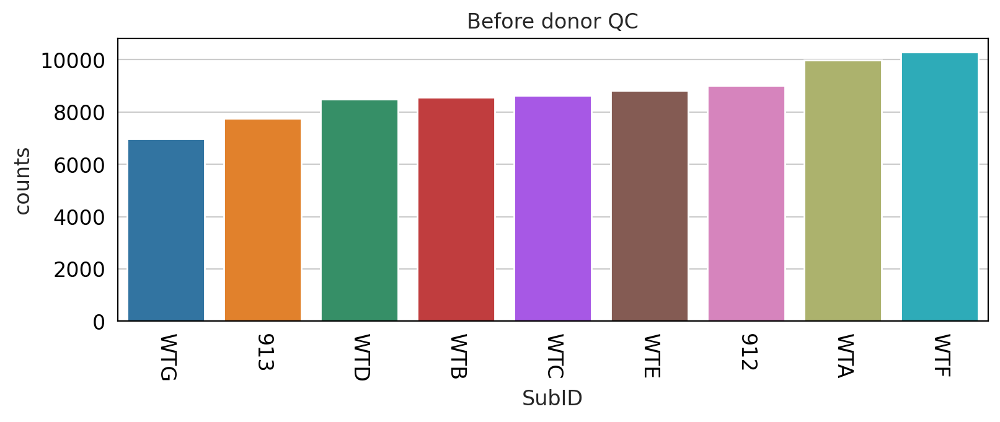

Number of cells before QC: 78565.0
Average number of cells per sample before QC:  8729.4




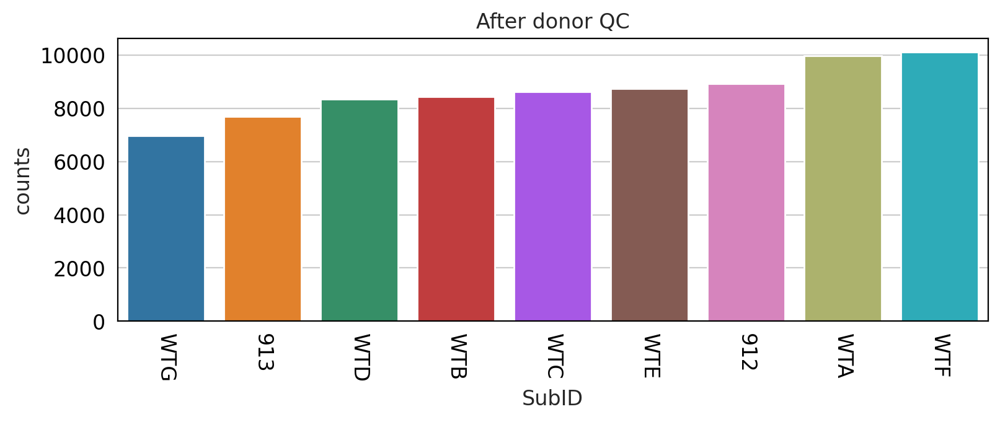

Number of cells after QC: 77833.0
Average number of cells per sample after QC:  8648.1


In [16]:
### before QC
donor_summary = data.obs.SubID.value_counts().rename_axis('SubID').reset_index(name='counts')

plt.figure(figsize=(9, 3))
sns.barplot(x='SubID', y='counts', data=donor_summary[:], order=donor_summary[:].sort_values('counts').SubID)
plt.xticks(rotation=-90)
plt.title("Before donor QC")
plt.show()

print(f'Number of cells before QC: {np.sum(donor_summary[donor_summary.counts>0].counts):7.1f}')
print(f'Average number of cells per sample before QC: {np.mean(donor_summary[donor_summary.counts>0].counts):7.1f}')
print()
print()

### after QC
donor_summary = data.obs[data.obs.passed_qc].SubID.value_counts().rename_axis('SubID').reset_index(name='counts')

plt.figure(figsize=(9, 3))
sns.barplot(x='SubID', y='counts', data=donor_summary[:], order=donor_summary[:].sort_values('counts').SubID)
plt.xticks(rotation=-90)
plt.title("After donor QC")
plt.show()
print(f'Number of cells after QC: {np.sum(donor_summary[donor_summary.counts>0].counts):7.1f}')
print(f'Average number of cells per sample after QC: {np.mean(donor_summary[donor_summary.counts>0].counts):7.1f}')


### Percent Mito
TODO: unusure if this analysis is correct

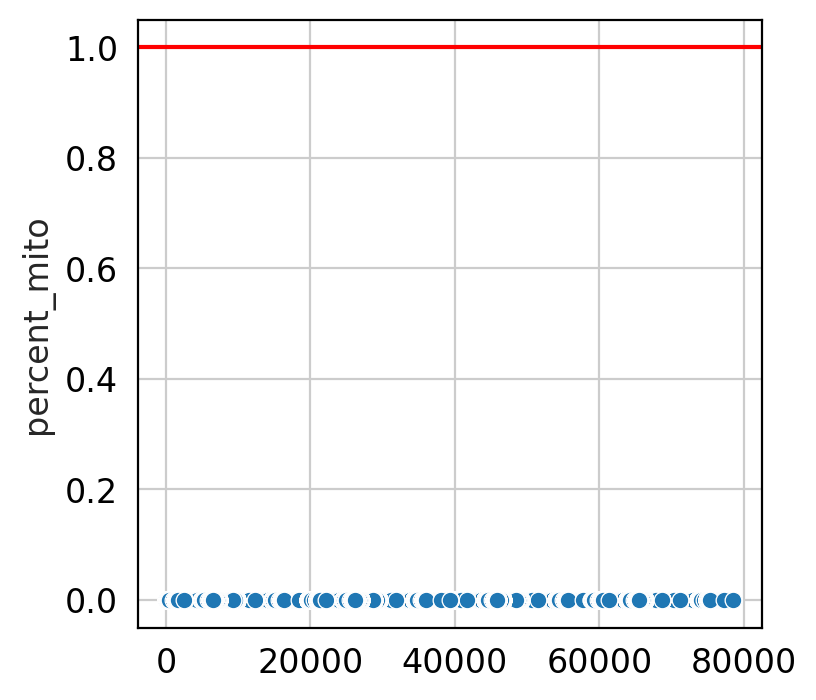

In [17]:
percent_mito = data.obs.percent_mito

temp = percent_mito.argsort()
ranks = np.empty_like(temp)
ranks[temp] = np.arange(len(percent_mito))

sns.scatterplot(x=ranks, y=percent_mito)
plt.axhline(1, color='red')

### Filter the data
Filter, identify robst gene after filtering, and log normalize the counts

In [20]:
pg.filter_data(data)
pg.identify_robust_genes(data)
pg.log_norm(data)

2023-07-23 21:43:35,484 - pegasusio.qc_utils - INFO - After filtration, 77833 out of 77833 cell barcodes are kept in UnimodalData object GRCm39-rna.
2023-07-23 21:43:35,485 - pegasus.tools.preprocessing - INFO - Function 'filter_data' finished in 0.15s.
2023-07-23 21:43:36,245 - pegasus.tools.preprocessing - INFO - After filtration, 24058/24058 genes are kept. Among 24058 genes, 24057 genes are robust.
2023-07-23 21:43:36,246 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.76s.
2023-07-23 21:43:37,148 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.90s.


### Copy data
To run analysis that involves raw counts

In [21]:
data_trial = data.copy()

In [22]:
pg.highly_variable_features(data_trial)

2023-07-23 21:44:18,017 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.25s.
2023-07-23 21:44:18,070 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2023-07-23 21:44:18,071 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.31s.


In [23]:
data_trial.var.loc[data_trial.var['highly_variable_features']].sort_values(by='hvf_rank')

,gene_name,gene_type,gene_id,gene_chrom,gene_start,gene_end,n_cells,percent_cells,robust,highly_variable_features,ribosomal,mitochondrial,protein_coding,mitocarta_genes,robust_protein_coding,mean,var,hvf_loess,hvf_rank
featurekey,,,,,,,,,,,,,,,,,,,
Gpc5,Gpc5,protein_coding,ENSMUSG00000022112,14,115329647.0,116762591.0,27121,34.845117,True,True,False,False,True,False,True,1.641323,6.027201,3.378200,0
Erbb4,Erbb4,protein_coding,ENSMUSG00000062209,1,68071345.0,69147218.0,34942,44.893554,True,True,False,False,True,False,True,2.115293,6.410805,3.855520,3
St18,St18,protein_coding,ENSMUSG00000033740,1,6557455.0,6931164.0,17452,22.422366,True,True,False,False,True,False,True,1.071094,4.399620,2.545571,8
Npas3,Npas3,protein_coding,ENSMUSG00000021010,12,53294940.0,54118958.0,33395,42.905965,True,True,False,False,True,False,True,1.962944,5.802519,3.726671,20
Galntl6,Galntl6,protein_coding,ENSMUSG00000096914,8,58227086.0,59365674.0,42115,54.109439,True,True,False,False,True,False,True,2.554322,6.358276,4.153780,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Cdh3,Cdh3,protein_coding,ENSMUSG00000061048,8,107237523.0,107283929.0,166,0.213277,True,True,False,False,True,False,True,0.007772,0.029986,0.024145,4801
Hvcn1,Hvcn1,protein_coding,ENSMUSG00000064267,5,122344867.0,122380360.0,481,0.617990,True,True,False,False,True,False,True,0.019843,0.072525,0.061560,4801
Cyp7b1,Cyp7b1,protein_coding,ENSMUSG00000039519,3,18126114.0,18297502.0,17742,22.794958,True,True,False,False,True,False,True,0.747051,2.044596,1.918793,4802


### Compute PCA and perform clustering

In [24]:
pg.pca(data_trial)

2023-07-23 21:45:45,396 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 34.48s.


In [25]:
pg.neighbors(data_trial)

2023-07-23 21:45:58,395 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 12.99s.
2023-07-23 21:46:00,843 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 2.45s.


In [26]:
pg.louvain(data_trial)

2023-07-23 21:46:03,463 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 2.61s.
2023-07-23 21:46:58,765 - pegasus.tools.clustering - INFO - Louvain clustering is done. Get 31 clusters.
2023-07-23 21:46:58,877 - pegasus.tools.clustering - INFO - Function 'louvain' finished in 58.03s.


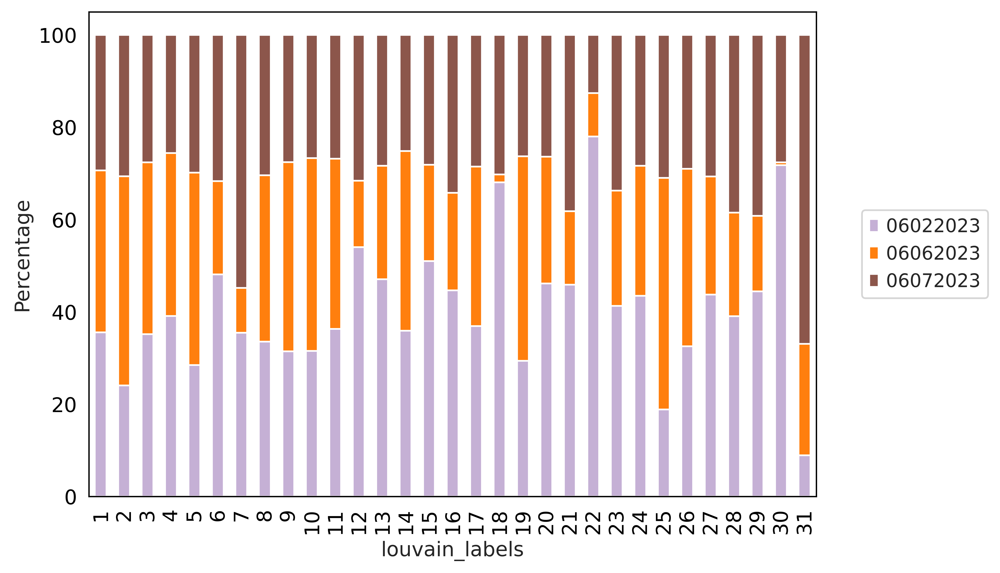

In [27]:
pg.compo_plot(data_trial, 'louvain_labels', 'Channel')

### Apply Harmony to better map each Channel onto the full set of clusters

In [28]:
pg.highly_variable_features(data, batch='Channel') 
pg.pca(data,  n_components=50)
pca_key = pg.run_harmony(data)

2023-07-23 21:47:20,731 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.43s.
2023-07-23 21:47:20,778 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2023-07-23 21:47:20,779 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.48s.
2023-07-23 21:47:50,986 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 30.21s.
2023-07-23 21:47:51,023 - pegasus.tools.batch_correction - INFO - Start integration using Harmony.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).
2023-07-23 21:52:46,117 - pegasus.tools.batch_correction - INFO - Function 'run_harmony' finished in 295.13s.


In [29]:
pg.neighbors(data, rep=pca_key)
pg.louvain(data, rep=pca_key, resolution=1.3) # default resolution is 1.3

2023-07-23 21:52:59,307 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 13.18s.
2023-07-23 21:53:01,682 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 2.37s.
2023-07-23 21:53:04,398 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 2.72s.
2023-07-23 21:53:40,210 - pegasus.tools.clustering - INFO - Louvain clustering is done. Get 32 clusters.
2023-07-23 21:53:40,325 - pegasus.tools.clustering - INFO - Function 'louvain' finished in 38.64s.


### Compute UMAP

In [30]:
pg.umap(data, rep=pca_key)

2023-07-23 21:53:40,330 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2023-07-23 21:53:40,331 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
UMAP(min_dist=0.5, precomputed_knn=(array([[    0, 2036, 1692, ..., 10095, 2351, 7926],
       [    1, 1738, 6753, ..., 18275, 17939, 2355],
       [    2, 2543, 71978, ..., 51933, 71226, 72779],
       ...,
       [77830, 44355, 76365, ..., 49028, 76022, 29553],
       [77831, 2231, 31313, ..., 46887, 46738, 1295],
       [77832, 69139, 70269, ..., 32507, 60714, 30154]]), array([[ 0.       , 10.132627 , 10.203868 , ..., 12.759966 , 12.813252 ,
        12.906239 ],
       [ 0.       , 5.311955 , 5.6829324, ..., 6.3343983, 6.3740315,
         6.3846354],
       [ 0.       , 3.9399753, 4.098719 , ..., 4.4613614, 4.463675 ,
         4.4652166],
       ...,
       [ 0.       , 3.521777 , 4.0528054, ..., 4.428534 , 4.5031967,
         4.5223503],
       [ 0.     

Epochs completed: 100%| ██████████ 200/200 [01:27]

Sun Jul 23 21:55:21 2023 Finished embedding
2023-07-23 21:55:21,215 - pegasus.tools.visualization - INFO - Function 'umap' finished in 100.89s.


### Annotate cell types

In [31]:
pg.de_analysis(data, cluster='louvain_labels')

2023-07-23 21:55:26,572 - pegasus.tools.diff_expr - INFO - CSR matrix is converted to CSC matrix. Time spent = 5.3171s.
2023-07-23 21:57:01,220 - pegasus.tools.diff_expr - INFO - MWU test and AUROC calculation are finished. Time spent = 94.6473s.
2023-07-23 21:57:01,563 - pegasus.tools.diff_expr - INFO - Sufficient statistics are collected. Time spent = 0.3431s.
2023-07-23 21:57:01,866 - pegasus.tools.diff_expr - INFO - Differential expression analysis is finished.
2023-07-23 21:57:01,867 - pegasus.tools.diff_expr - INFO - Function 'de_analysis' finished in 100.65s.


In [32]:
marker_dict = pg.markers(data)

In [33]:
celltype_dict = pg.infer_cell_types(data, markers = 'mouse_brain')
cluster_names = pg.infer_cluster_names(celltype_dict)

In [34]:
pg.annotate(data, name='anno', based_on='louvain_labels', anno_dict=cluster_names)
data.obs['anno'].value_counts()

anno
Glutamatergic layer 2/3 IT      8270
Oligodendrocyte                 7863
Glutamatergic layer 6 CT        7360
4                               7007
Astrocyte                       6541
GABAergic Lamp5 interneuron     4793
Astrocyte-2                     4187
Glutamatergic layer 6 IT        3343
GABAergic Sst interneuron       2248
GABAergic Vip interneuron       2201
GABAergic Pvalb interneuron     2176
Glutamatergic layer L56 NP      2130
Smooth muscle cell              1875
Microglia                       1830
Oligodendrocyte-2               1684
Fibroblast                      1598
OPC                             1571
GABAergic Sst interneuron-2     1505
Glutamatergic layer 2/3 IT-2    1363
Glutamatergic layer 5 IT        1209
Glutamatergic layer 5 IT-2      1150
Endothelial                     1118
Fibroblast-2                     860
24                               686
Glutamatergic layer 6 IT-2       562
Glutamatergic layer L56 NP-2     550
Glutamatergic neuron             

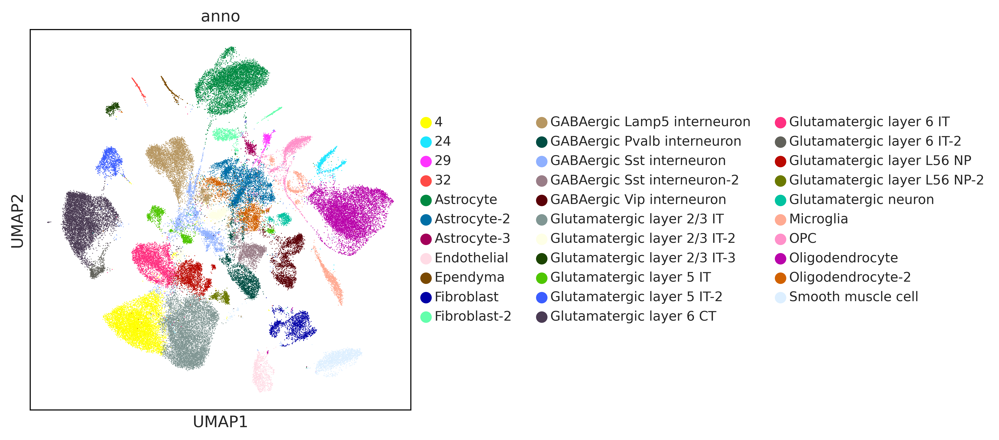

In [35]:
pg.scatter(data, attrs='anno', basis='umap', dpi=300)

### Doublet detection

2023-07-23 21:57:05,836 - pegasus.tools.preprocessing - INFO - After filtration, 24057/24058 genes are kept. Among 24057 genes, 23804 genes are robust.
2023-07-23 21:57:05,836 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 1.05s.
2023-07-23 21:57:06,326 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.49s.
2023-07-23 21:57:06,430 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.10s.
2023-07-23 21:57:06,475 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2023-07-23 21:57:06,476 - pegasus.tools.hvf_selection - INFO - Function 'highly_variable_features' finished in 0.15s.


/sc/arion/work/massen06/.conda/envs/qc/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2023-07-23 21:57:45,641 - pegasus.tools.doublet_detection - INFO - Sample 06022023: doublet threshold = 0.3396; total cells = 29030; neotypic doublet rate in simulation = 58.67%; neotypic doublet rate = 12.41%.
2023-07-23 21:57:46,254 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 39.78s.
2023-07-23 21:57:47,713 - pegasus.tools.preprocessing - INFO - After filtration, 24054/24058 genes are kept. Among 24054 genes, 22232 genes are robust.
2023-07-23 21:57:47,714 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.82s.
2023-07-23 21:57:47,968 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.25s.
2023-07-23 21:57:48,028 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.06s.
2023-07-23 21:57:48,071 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2023-07-23 21:57:48,072 - pegasus.tools.hvf_selection - INFO - Function 'h

/sc/arion/work/massen06/.conda/envs/qc/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2023-07-23 21:58:20,750 - pegasus.tools.doublet_detection - INFO - Sample 06062023: doublet threshold = 0.4323; total cells = 24865; neotypic doublet rate in simulation = 56.53%; neotypic doublet rate = 5.62%.
2023-07-23 21:58:21,339 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 33.27s.
2023-07-23 21:58:23,094 - pegasus.tools.preprocessing - INFO - After filtration, 24055/24058 genes are kept. Among 24055 genes, 23924 genes are robust.
2023-07-23 21:58:23,094 - pegasus.tools.preprocessing - INFO - Function 'identify_robust_genes' finished in 0.96s.
2023-07-23 21:58:23,526 - pegasus.tools.preprocessing - INFO - Function 'log_norm' finished in 0.43s.
2023-07-23 21:58:23,618 - pegasus.tools.hvf_selection - INFO - Function 'estimate_feature_statistics' finished in 0.09s.
2023-07-23 21:58:23,663 - pegasus.tools.hvf_selection - INFO - 2000 highly variable features have been selected.
2023-07-23 21:58:23,663 - pegasus.tools.hvf_selection - INFO - Function 'hi

/sc/arion/work/massen06/.conda/envs/qc/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


2023-07-23 21:58:56,930 - pegasus.tools.doublet_detection - INFO - Sample 06072023: doublet threshold = 0.4209; total cells = 23938; neotypic doublet rate in simulation = 48.14%; neotypic doublet rate = 5.92%.
2023-07-23 21:58:57,508 - pegasus.tools.doublet_detection - INFO - Function '_run_scrublet' finished in 33.84s.
2023-07-23 21:58:58,034 - pegasus.tools.doublet_detection - INFO - Doublets are predicted!
2023-07-23 21:58:58,096 - pegasus.tools.doublet_detection - INFO - Function 'infer_doublets' finished in 113.67s.


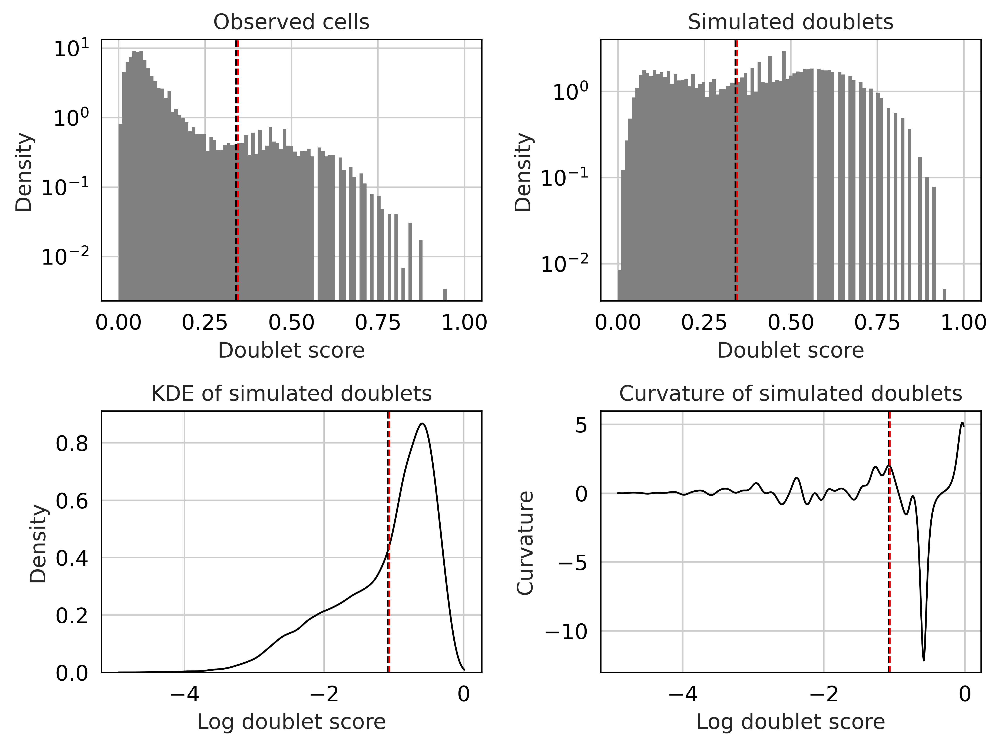

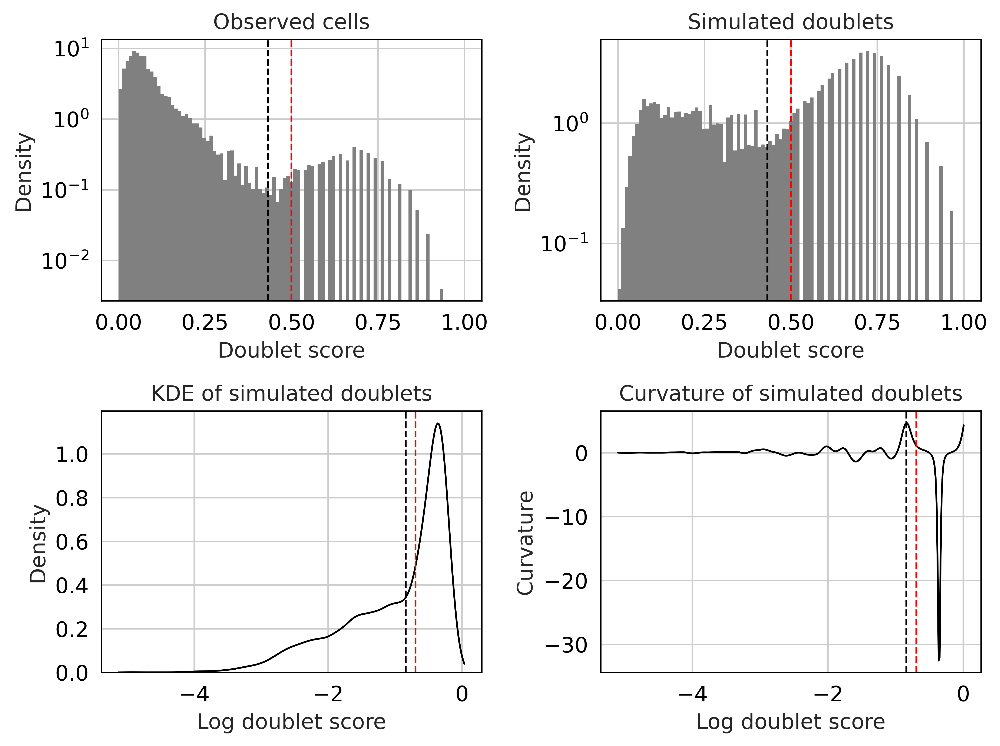

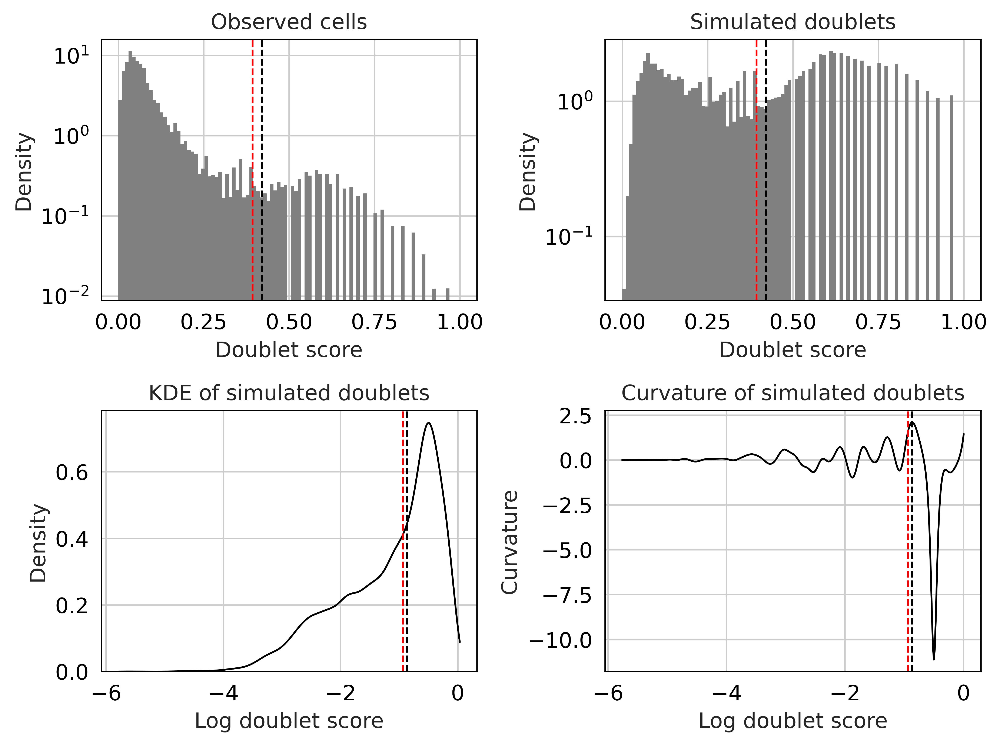

In [36]:
pg.infer_doublets(data, channel_attr = 'Channel', clust_attr = 'anno') 

In [37]:
print(f"Percentage of doublets: {100 * np.mean(data.obs.pred_dbl):1.4f}%")

Percentage of doublets: 8.2459%


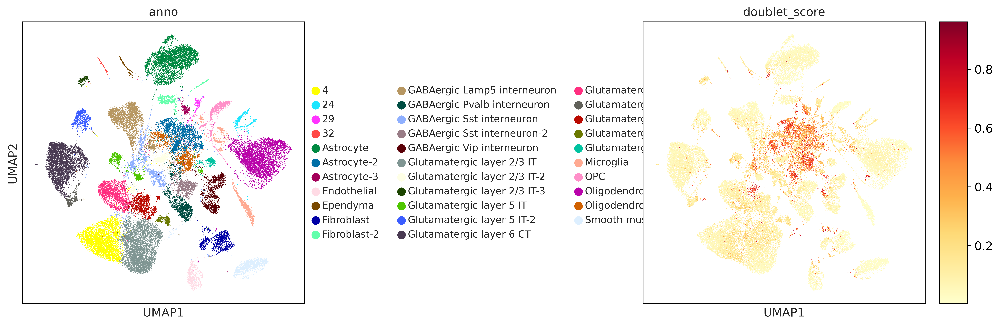

In [38]:
pg.scatter(data,attrs=['anno','doublet_score'], basis='umap', wspace=1.2) 